# Visualizing advance of perihelion of a test particle in Schwarzschild space-time¶


In [2]:
import numpy as np
import astropy.units as u
from einsteinpy.plotting import ScatterGeodesicPlotter
from einsteinpy.coordinates import SphericalDifferential

In [8]:
M = 6e24 * u.kg
sph_obj = SphericalDifferential(130*u.m, np.pi/2*u.rad, -np.pi/8*u.rad,
                                0*u.m/u.s, 0*u.rad/u.s, 1900*u.rad/u.s)

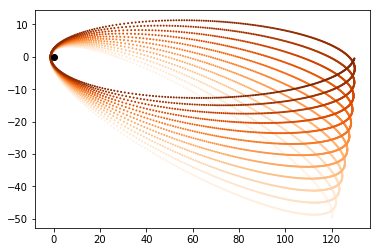

In [9]:
%matplotlib inline
obj = ScatterGeodesicPlotter(M)
obj.plot(sph_obj, 0.002, 5e-8)
obj.show()

## Using Plotly for Interactive Plots:

In [10]:
M = 6e24 * u.kg
sph_obj = SphericalDifferential(130*u.m, np.pi/2*u.rad, -np.pi/8*u.rad,
                                0*u.m/u.s, 0*u.rad/u.s, 1900*u.rad/u.s)

In [11]:
%matplotlib inline
obj = InteractiveScatterGeodesicPlotter(M)
obj.plot(sph_obj, 0.002, 5e-8)
obj.show()

# Visualizing event horizon and ergosphere of Kerr black hole¶


In [12]:
import numpy as np
import astropy.units as u
import matplotlib.pyplot as plt
from einsteinpy.utils import kerr_utils, schwarzschild_radius

In [13]:
M = 4e30
scr = schwarzschild_radius(M * u.kg).value
# for nearly maximally rotating black hole
a1 = 0.499999*scr
# for ordinary black hole
a2 = 0.3*scr

In [14]:
ergo1, ergo2, hori1, hori2 = list(), list(), list(), list()
thetas = np.linspace(0, np.pi, 720)
for t in thetas:
    ergo1.append(kerr_utils.radius_ergosphere(M, a1, t, "Spherical"))
    ergo2.append(kerr_utils.radius_ergosphere(M, a2, t, "Spherical"))
    hori1.append(kerr_utils.event_horizon(M, a1, t, "Spherical"))
    hori2.append(kerr_utils.event_horizon(M, a2, t, "Spherical"))
ergo1, ergo2, hori1, hori2 = np.array(ergo1), np.array(ergo2), np.array(hori1), np.array(hori2)

In [15]:
Xe1, Ye1 = ergo1[:,0] * np.sin(ergo1[:,1]), ergo1[:,0] * np.cos(ergo1[:,1])
Xh1, Yh1 = hori1[:,0] * np.sin(hori1[:,1]), hori1[:,0] * np.cos(hori1[:,1])
Xe2, Ye2 = ergo2[:,0] * np.sin(ergo2[:,1]), ergo2[:,0] * np.cos(ergo2[:,1])
Xh2, Yh2 = hori2[:,0] * np.sin(hori2[:,1]), hori2[:,0] * np.cos(hori2[:,1])

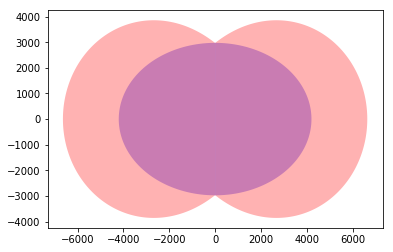

In [16]:
%matplotlib inline
fig, ax = plt.subplots()
# for maximally rotating black hole
ax.fill(Xh1, Yh1, 'b', Xe1, Ye1, 'r', alpha=0.3)
ax.fill(-1*Xh1, Yh1, 'b', -1*Xe1, Ye1, 'r', alpha=0.3)

## Using Plotly for Interactive Plots:

In [17]:
trace1 = go.Scatter(
    x=Xh1,
    y=Yh1,
    fill='tozeroy',
        line=dict(
        color='rgb(143, 19, 131)',
    )
)
trace2 = go.Scatter(
    x=Xe1,
    y=Ye1,
    fill='tonexty',
        line=dict(
        color='rgb(204, 51, 0)',
    )
)
trace3 = go.Scatter(
    x=-1*Xh1,
    y=Yh1,
    fill='tozeroy',
        line=dict(
        color='rgb(143, 19, 131)',
    )
)
trace4 = go.Scatter(
    x=-1*Xe1,
    y=Ye1,
    fill='tonexty',
        line=dict(
        color='rgb(204, 51, 0)',
    )
)

data = [trace1, trace2, trace3, trace4]
iplot(data, filename='basic-area')

# Animations in EinsteinPY

In [18]:
import numpy as np
import astropy.units as u
from einsteinpy.plotting import ScatterGeodesicPlotter
from einsteinpy.coordinates import SphericalDifferential

In [19]:
M = 6e24 * u.kg
sph_obj = SphericalDifferential(130*u.m, np.pi/2*u.rad, -np.pi/8*u.rad,
                                0*u.m/u.s, 0*u.rad/u.s, 1900*u.rad/u.s)

C:\Users\ratin\AppData\Local\Continuum\anaconda3\lib\site-packages\einsteinpy-0.2.dev0-py3.7.egg\einsteinpy\metric\schwarzschild.py:138: RuntimeWarning:

particle reached Schwarzchild Radius. 



<IPython.core.display.Javascript object>


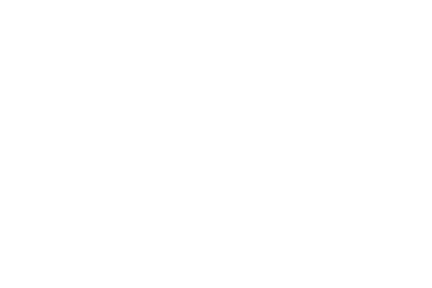

C:\Users\ratin\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:1442: UserWarning:

Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=120.10433922646727, right=120.10433922646727

C:\Users\ratin\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:1479: UserWarning:

Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-49.748846207461675, top=-49.748846207461675



<IPython.core.display.Javascript object>


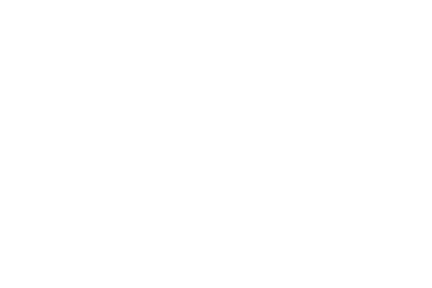

Traceback (most recent call last):
  File "C:\Users\ratin\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py", line 215, in process
    func(*args, **kwargs)
  File "C:\Users\ratin\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\animation.py", line 1478, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


In [30]:
# %matplotlib notebook
obj = ScatterGeodesicPlotter(M)
obj.animate(sph_obj, 0.002, 5e-8, interval=25)
obj.show()

## Using Plotly for Interactive Animation:

In [6]:
M = 6e24 * u.kg
sph_obj = SphericalDifferential(130*u.m, np.pi/2*u.rad, -np.pi/8*u.rad,
                                 0*u.m/u.s, 0*u.rad/u.s, 1900*u.rad/u.s)
import time

In [7]:
st = time.time()
obj = InteractiveScatterGeodesicPlotter(M)
obj.animate(sph_obj, 0.002, 5e-8, )
obj.show()
print(time.time()-st)

6.156545877456665


# Visualizing frame dragging in Kerr space-time


In [23]:
from astropy import units as u
import numpy as np
from einsteinpy.metric import Kerr
from einsteinpy.coordinates import BoyerLindquistDifferential

In [24]:
M = 1.989e30 * u.kg
a = 0.3 * u.m
BL_obj = BoyerLindquistDifferential(50e5 * u.km, np.pi / 2 * u.rad, np.pi * u.rad,
                                    0 * u.km / u.s, 0 * u.rad / u.s, 0 * u.rad / u.s,
                                    a)

In [25]:
end_lambda = ((1 * u.year).to(u.s)).value / 930
# Choosing stepsize for ODE solver to be 0.02 minutes
stepsize = ((0.02 * u.min).to(u.s)).value

In [26]:
obj = Kerr.from_BL(BL_obj, M)
ans = obj.calculate_trajectory(
    end_lambda=end_lambda, OdeMethodKwargs={"stepsize": stepsize}, return_cartesian=True
)
x, y = ans[1][:,1], ans[1][:,2]

<IPython.core.display.Javascript object>


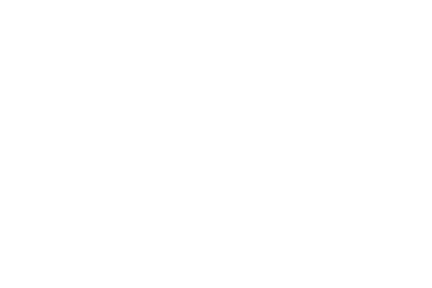

<IPython.core.display.Javascript object>


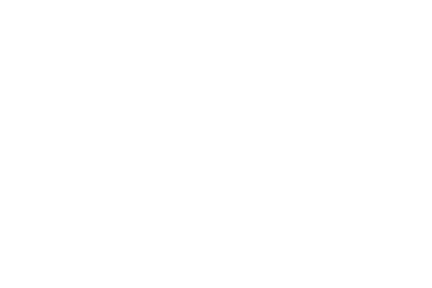

In [31]:
import matplotlib.pyplot as plt
plt.scatter(x,y, s=0.2)
plt.scatter(0,0, c='black')
plt.show()

## Using Plotly for Interactive Plots:

In [28]:
trace = go.Scatter(
    x = x,
    y = y
)

data = [trace]

iplot(data, filename='basic-line')

# Code for InteractiveScatterGeodesicPlotter:

In [3]:
import astropy.units as u
import numpy as np

from einsteinpy.metric import Schwarzschild

import plotly.graph_objs as go
import plotly.io as pio
from plotly.offline import init_notebook_mode, iplot


class InteractiveScatterGeodesicPlotter:
    """
    Class for plotting interactive plotly plots.
    """

    def __init__(
        self, mass, time=0 * u.s, attractor_color="black", cmap_color="Orange", nb_connected=True
    ):
        """

        Parameters
        ----------
        attractor_color : string, optional
            Color which is used to denote the attractor. Defaults to black.
        cmap_color : string, optional
            Color used in function plot.
        nb_connected: boolean, True
            Declare the use of Jupyter Notebook.

        """
        self.mass = mass
        self.time = time
        self.data = []
        self.trace = None
        self.fig = None
        self.nb_connected = nb_connected
        self._attractor_present = False
        self.attractor_color = attractor_color
        self.layout = dict(title='Interactive Plot', yaxis=dict(zeroline=False), xaxis=dict(zeroline=False))
        self.cmap_color = cmap_color

    def _plot_attractor(self):

        self._attractor_present = True
        self.data.append(
            go.Scatter(x=[0], y=[0], mode='markers', name='attractor',
                       marker=dict(size=5, color=self.attractor_color, line=dict(width=2)))
        )

    def plot(self, coords, end_lambda=10, step_size=1e-3):
        """

        Parameters
        ----------
        coords : ~einsteinpy.coordinates.velocity.SphericalDifferential
            Position and velocity components of particle in Spherical Coordinates.
        end_lambda : float, optional
            Lambda where iteartions will stop.
        step_size : float, optional
            Step size for the ODE.

        """

        swc = Schwarzschild.from_spherical(coords, self.mass, self.time)

        vals = swc.calculate_trajectory(
            end_lambda=end_lambda, OdeMethodKwargs={"stepsize": step_size}
        )[1]

        # time = vals[:, 0]
        r = vals[:, 1]
        # Currently not being used (might be useful in future)
        # theta = vals[:, 2]
        phi = vals[:, 3]

        pos_x = r * np.cos(phi)
        pos_y = r * np.sin(phi)

        self.data.append(
            go.Scatter(x=pos_x, y=pos_y, mode='markers', name='markers',
                       marker=dict(size=5, color=self.cmap_color, line=dict(width=2)))
        )

        init_notebook_mode(connected=self.nb_connected)
        self.fig = dict(data=self.data, layout=self.layout)

        if not self._attractor_present:
            self._plot_attractor()

    # TODO: WIP
    def animate(self, coords, end_lambda=10, step_size=1e-3, interval=50):
        """
        Function to generate animated plots of geodesics.

        Parameters
        ----------
        coords : ~einsteinpy.coordinates.velocity.SphericalDifferential
            Position and velocity components of particle in Spherical Coordinates.
        end_lambda : float, optional
            Lambda where iteartions will stop.
        step_size : float, optional
            Step size for the ODE.
        interval : int, optional
            Control the time between frames. Add time in milliseconds.

        """

        swc = Schwarzschild.from_spherical(coords, self.mass, self.time)

        vals = swc.calculate_trajectory(
            end_lambda=end_lambda, OdeMethodKwargs={"stepsize": step_size}
        )[1]

        time = vals[:, 0]
        r = vals[:, 1]
        # Currently not being used (might be useful in future)
        # theta = vals[:, 2]
        phi = vals[:, 3]

        pos_x = r * np.cos(phi)
        pos_y = r * np.sin(phi)
        x_max, x_min = max(pos_x), min(pos_x)
        y_max, y_min = max(pos_y), min(pos_y)
        margin_x = (x_max - x_min) * 0.1
        margin_y = (y_max - y_min) * 0.1

        self.data = [dict(visible=False, line=dict(color='#00CED1', width=6), name='',
                     x=pos_x[:i], y=pos_y[:i]) for i in range(0, len(pos_x), 100)]

        steps = []
        for i in range(len(self.data)):
            step = dict(
                method='restyle',
                args=['visible', [False] * len(self.data)],
            )
            step['args'][1][i] = True  # Toggle i'th trace to "visible"
            steps.append(step)

        # TODO: Will change initialization of self.layout to give a better and shorter definition below.
        self.layout = dict(sliders=[dict(active=100, currentvalue={"prefix": "Frequency: "},
                           pad={"t": 50}, steps=steps)], title='[EINSTEINPY] Plotly Animation', hovermode='closest',
                           xaxis=dict(tickmode='linear', ticks='outside', tick0=int(x_min - margin_x),
                           dtick=int((x_max + margin_x - x_min - margin_x)) / 10, ticklen=8, tickwidth=4, tickcolor='#000'),
                           yaxis=dict(tickmode='linear', ticks='outside', tick0=int(y_min - margin_y), dtick=int((y_max + margin_y - y_min - margin_y) / 10),
                           ticklen=8, tickwidth=4, tickcolor='#000'), updatemenus=[{'type': 'buttons', 'buttons': [{'label': 'Play', 'method': 'animate', 'args': [None]}]}])
        self.fig = dict(data=self.data, layout=self.layout)

    def show(self):
        """
        Function to show generated plots of geodesics.

        Parameters
        ----------

        """
        iplot(self.fig, filename='InteractiveScatterGeodesicPlotter')

# TODO: WIP
# INFO: Requires installation of ORCA for saving as images, but saving as a .html file doesn't.
    def save(self, name="interactive_scatter_geodesic.jpeg"):
        """
        Function to generate animated plots of geodesics.

        Parameters
        ----------
        name : string, optional
            Name for saving the plot

        """
        pio.write_image(self.fig, name)
